In [ ]:
!pip install ultralytics
!pip install supervision

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 881.4/881.4 kB 24.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 151.5/151.5 kB 5.9 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO
import supervision as sv
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial.distance import cdist
import math
from PIL import Image
from skimage.morphology import remove_small_objects
from skimage.io import imread, imsave
import time
import pandas as pd

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
#Modelo de detección (Crear el bounding box para eliminar fondo de la imagen)
model_det = YOLO('/content/drive/MyDrive/DeteccionCircular/best.pt')
#Modelo de segmentación (2 Clases)
model_seg = YOLO('/content/drive/MyDrive/Nuevo_Entrenamientos_PBacterias/best_SinTF_50T.pt')

In [ ]:
!unzip '/content/drive/MyDrive/Nuevo_Entrenamientos_PBacterias/Dataset_Prueba50T.zip'

Archive:  /content/drive/MyDrive/Nuevo_Entrenamientos_PBacterias/Dataset_Prueba50T.zip
   creating: Dataset_Prueba50T/
  inflating: Dataset_Prueba50T/IMG_2950.JPEG  
  inflating: Dataset_Prueba50T/IMG_2951.JPEG  
  inflating: Dataset_Prueba50T/IMG_2953.JPEG  
  inflating: Dataset_Prueba50T/IMG_2956.JPEG  
  inflating: Dataset_Prueba50T/IMG_3140.JPEG  
  inflating: Dataset_Prueba50T/IMG_3141.JPEG  
  inflating: Dataset_Prueba50T/IMG_2955.JPEG  
  inflating: Dataset_Prueba50T/IMG_2959.JPEG  
  inflating: Dataset_Prueba50T/IMG_2966.JPEG  
  inflating: Dataset_Prueba50T/IMG_3111.JPEG  
  inflating: Dataset_Prueba50T/IMG_3113.JPEG  
  inflating: Dataset_Prueba50T/IMG_3089.JPEG  
  inflating: Dataset_Prueba50T/IMG_3094.JPEG  
  inflating: Dataset_Prueba50T/IMG_3095.JPEG  
  inflating: Dataset_Prueba50T/IMG_3096.JPEG  
  inflating: Dataset_Prueba50T/IMG_3101.JPEG  
  inflating: Dataset_Prueba50T/IMG_3112.JPEG  
  inflating: Dataset_Prueba50T/IMG_3115.JPEG  
  inflating: Dataset_Prueba50T/IMG_

In [ ]:
def distancia_minima(puntos_contorno_bx, puntos_contorno_by, puntos_contorno_sx, puntos_contorno_sy):
    puntos_b = np.column_stack((puntos_contorno_bx, puntos_contorno_by))
    puntos_s = np.column_stack((puntos_contorno_sx, puntos_contorno_sy))

    distancias = cdist(puntos_b, puntos_s, metric = 'euclidean')
    distancia_min = np.min(distancias)

    indices_min = np.where(distancias == distancia_min)
    x1min, x2min = indices_min[0][0], indices_min[1][0]

    return distancia_min, x1min, x2min

/content/Dataset_Prueba50T/IMG_3124.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3124.JPEG: 160x128 1 Parte1, 12.7ms
Speed: 0.8ms preprocess, 12.7ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_3124.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 28.1ms
Speed: 1.1ms preprocess, 28.1ms inference, 2.7ms postprocess per image at shape (1, 3, 224, 192)


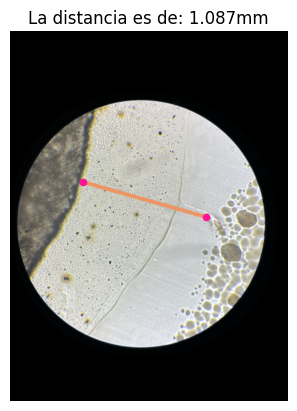

/content/Dataset_Prueba50T/IMG_5062.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5062.JPEG: 160x128 1 Parte1, 7.3ms
Speed: 0.7ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5062.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


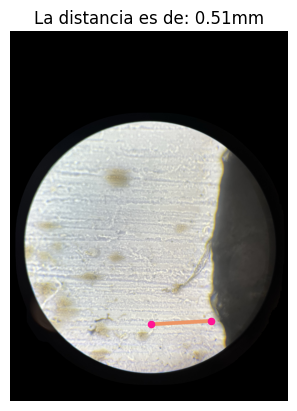

/content/Dataset_Prueba50T/IMG_5879.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5879.JPEG: 160x128 1 Parte1, 7.3ms
Speed: 0.6ms preprocess, 7.3ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5879.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


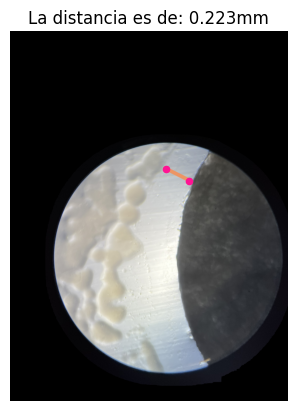

/content/Dataset_Prueba50T/IMG_5844.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5844.JPEG: 160x128 1 Parte1, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5844.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.2ms postprocess per image at shape (1, 3, 224, 192)


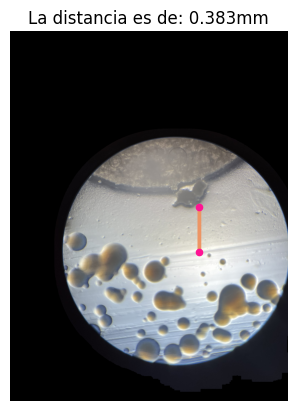

/content/Dataset_Prueba50T/IMG_5070.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5070.JPEG: 160x128 1 Parte1, 7.4ms
Speed: 0.7ms preprocess, 7.4ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5070.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.8ms postprocess per image at shape (1, 3, 224, 192)


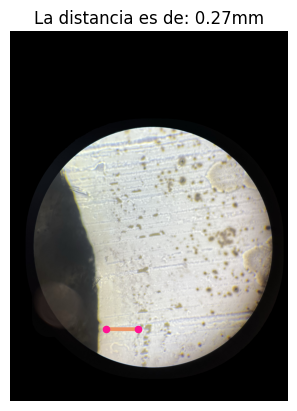

/content/Dataset_Prueba50T/IMG_5769.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5769.JPEG: 160x128 1 Parte1, 12.6ms
Speed: 0.8ms preprocess, 12.6ms inference, 2.0ms postprocess per image at shape (1, 3, 160, 128)
IMG_5769.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 3.2ms postprocess per image at shape (1, 3, 224, 192)


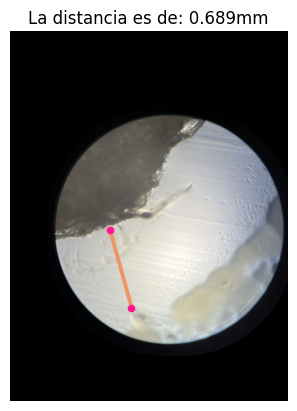

/content/Dataset_Prueba50T/IMG_5855.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5855.JPEG: 160x128 1 Parte1, 7.2ms
Speed: 0.7ms preprocess, 7.2ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5855.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.2ms preprocess, 27.1ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


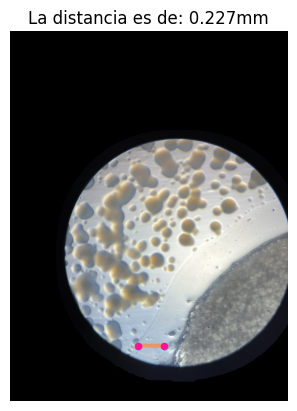

/content/Dataset_Prueba50T/IMG_3089.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3089.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.4ms postprocess per image at shape (1, 3, 160, 128)
IMG_3089.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


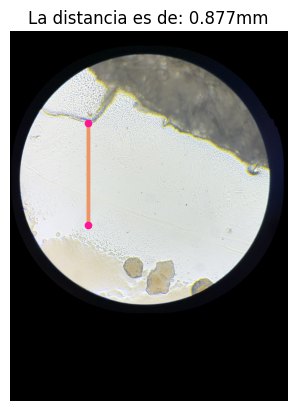

/content/Dataset_Prueba50T/IMG_5763.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5763.JPEG: 160x128 1 Parte1, 9.1ms
Speed: 0.7ms preprocess, 9.1ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5763.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


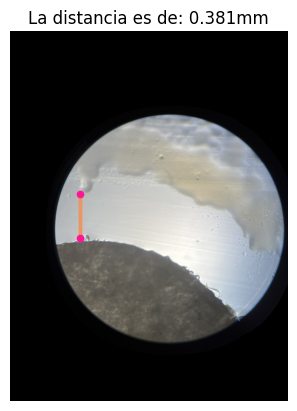

/content/Dataset_Prueba50T/IMG_What1.jpeg

image 1/1 /content/Dataset_Prueba50T/IMG_What1.jpeg: 160x128 1 Parte1, 7.4ms
Speed: 0.6ms preprocess, 7.4ms inference, 1.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_What1.jpeg

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.7ms preprocess, 26.9ms inference, 2.7ms postprocess per image at shape (1, 3, 224, 192)


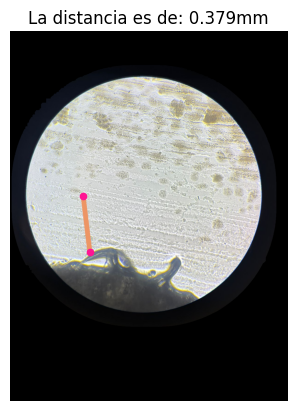

/content/Dataset_Prueba50T/IMG_5770.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5770.JPEG: 160x128 1 Parte1, 11.8ms
Speed: 0.8ms preprocess, 11.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5770.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


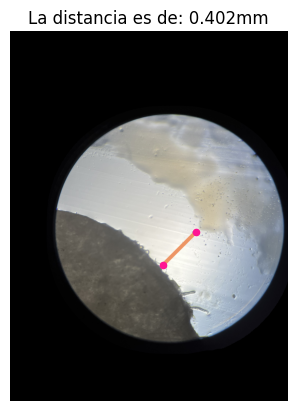

/content/Dataset_Prueba50T/IMG_5058.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5058.JPEG: 160x128 1 Parte1, 9.7ms
Speed: 0.7ms preprocess, 9.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5058.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


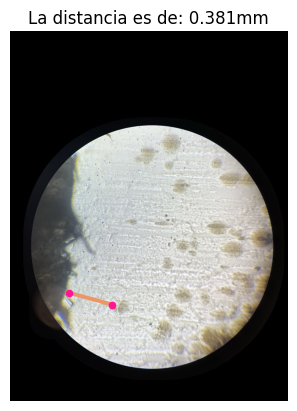

/content/Dataset_Prueba50T/IMG_5867.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5867.JPEG: 160x128 1 Parte1, 10.6ms
Speed: 0.8ms preprocess, 10.6ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5867.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


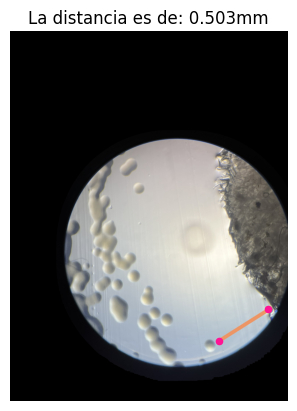

/content/Dataset_Prueba50T/IMG_2955.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2955.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_2955.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.8ms preprocess, 27.0ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


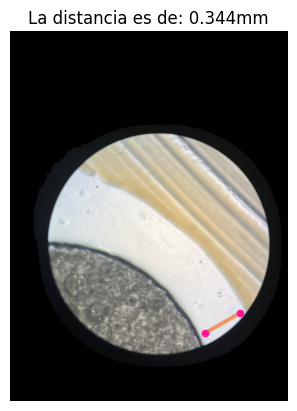

/content/Dataset_Prueba50T/IMG_2966.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2966.JPEG: 160x128 1 Parte1, 10.4ms
Speed: 0.8ms preprocess, 10.4ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_2966.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.9ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


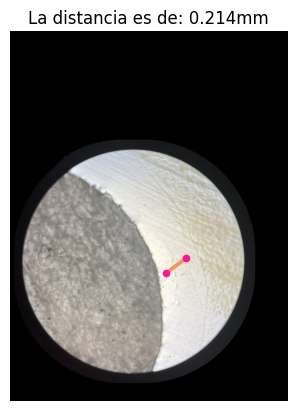

/content/Dataset_Prueba50T/IMG_3109.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3109.JPEG: 160x128 1 Parte1, 11.3ms
Speed: 2.1ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3109.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


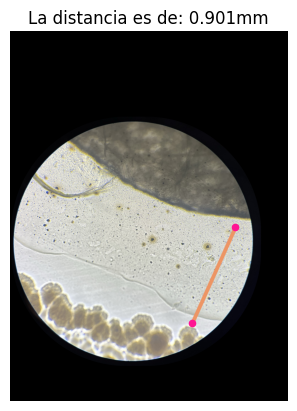

/content/Dataset_Prueba50T/IMG_5766.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5766.JPEG: 160x128 1 Parte1, 13.5ms
Speed: 4.9ms preprocess, 13.5ms inference, 2.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5766.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.8ms preprocess, 27.0ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


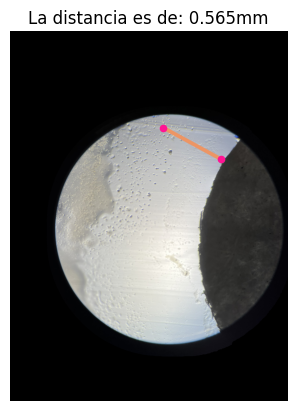

/content/Dataset_Prueba50T/IMG_5064.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5064.JPEG: 160x128 1 Parte1, 11.1ms
Speed: 0.7ms preprocess, 11.1ms inference, 3.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_5064.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.8ms preprocess, 27.0ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


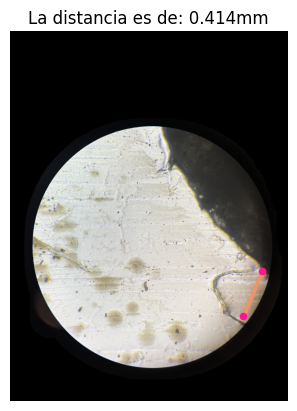

/content/Dataset_Prueba50T/IMG_What2.jpeg

image 1/1 /content/Dataset_Prueba50T/IMG_What2.jpeg: 160x128 1 Parte1, 14.3ms
Speed: 0.8ms preprocess, 14.3ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_What2.jpeg

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.8ms preprocess, 27.0ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


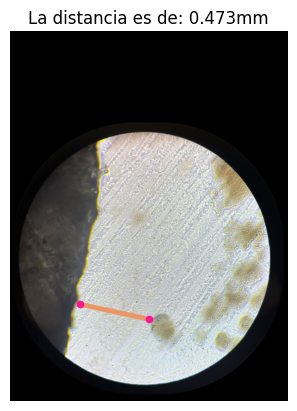

/content/Dataset_Prueba50T/IMG_5871.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5871.JPEG: 160x128 1 Parte1, 10.8ms
Speed: 0.8ms preprocess, 10.8ms inference, 5.0ms postprocess per image at shape (1, 3, 160, 128)
IMG_5871.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 1.1ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


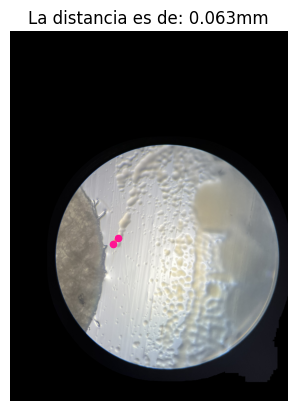

/content/Dataset_Prueba50T/IMG_5875.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5875.JPEG: 160x128 1 Parte1, 9.9ms
Speed: 0.8ms preprocess, 9.9ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5875.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


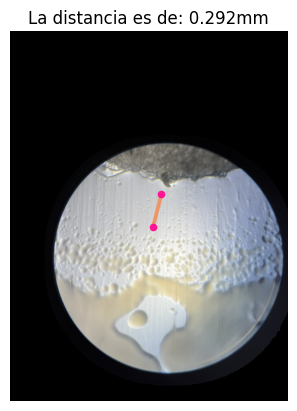

/content/Dataset_Prueba50T/IMG_5046.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5046.JPEG: 160x128 1 Parte1, 10.1ms
Speed: 0.7ms preprocess, 10.1ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5046.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


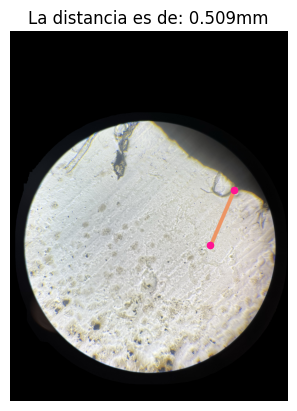

/content/Dataset_Prueba50T/IMG_3110.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3110.JPEG: 160x128 1 Parte1, 9.3ms
Speed: 0.8ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_3110.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 28.2ms
Speed: 1.3ms preprocess, 28.2ms inference, 6.7ms postprocess per image at shape (1, 3, 224, 192)


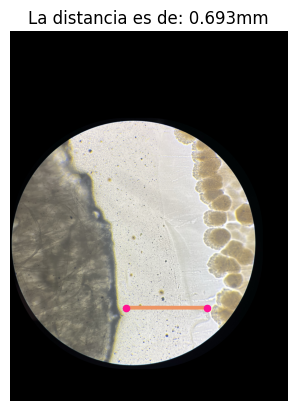

/content/Dataset_Prueba50T/IMG_2953.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2953.JPEG: 160x128 1 Parte1, 8.2ms
Speed: 0.8ms preprocess, 8.2ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_2953.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Sensidisco, 27.2ms
Speed: 2.2ms preprocess, 27.2ms inference, 2.8ms postprocess per image at shape (1, 3, 224, 192)
/content/Dataset_Prueba50T/IMG_5773.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5773.JPEG: 160x128 1 Parte1, 12.7ms
Speed: 0.7ms preprocess, 12.7ms inference, 4.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5773.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 4.5ms postprocess per image at shape (1, 3, 224, 192)


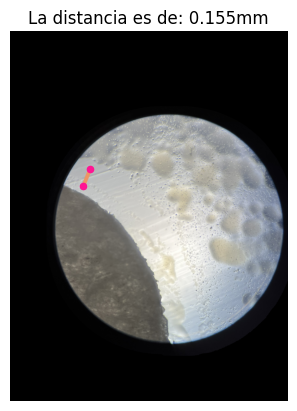

/content/Dataset_Prueba50T/IMG_3096.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3096.JPEG: 160x128 1 Parte1, 12.1ms
Speed: 0.9ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_3096.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


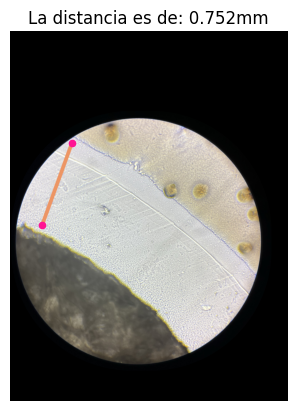

/content/Dataset_Prueba50T/IMG_5756.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5756.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.7ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_5756.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


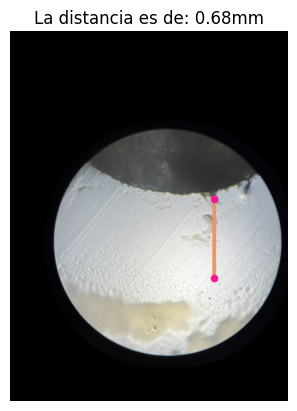

/content/Dataset_Prueba50T/IMG_5771.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5771.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.7ms preprocess, 8.9ms inference, 2.3ms postprocess per image at shape (1, 3, 160, 128)
IMG_5771.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.0ms preprocess, 27.1ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


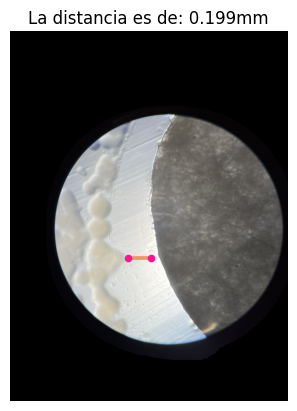

/content/Dataset_Prueba50T/IMG_3122.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3122.JPEG: 160x128 1 Parte1, 9.4ms
Speed: 0.9ms preprocess, 9.4ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3122.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.8ms preprocess, 27.0ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


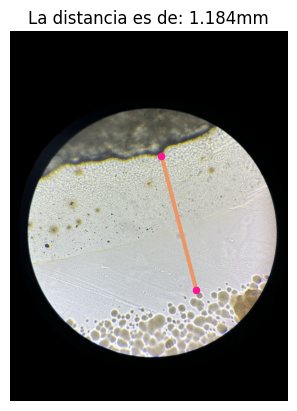

/content/Dataset_Prueba50T/IMG_3112.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3112.JPEG: 160x128 1 Parte1, 10.2ms
Speed: 0.9ms preprocess, 10.2ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3112.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


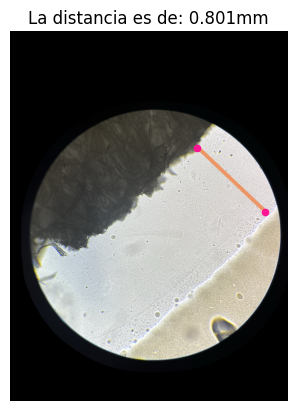

/content/Dataset_Prueba50T/IMG_5059.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5059.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5059.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


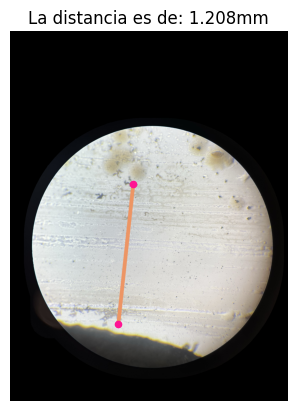

/content/Dataset_Prueba50T/IMG_5880.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5880.JPEG: 160x128 1 Parte1, 9.9ms
Speed: 0.7ms preprocess, 9.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5880.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


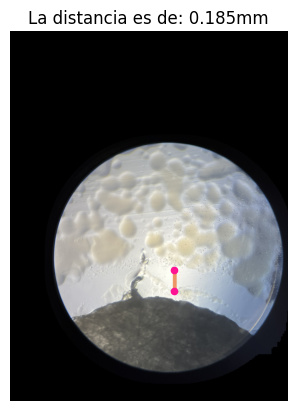

/content/Dataset_Prueba50T/IMG_5873.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5873.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.7ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5873.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 0.9ms preprocess, 27.0ms inference, 1.9ms postprocess per image at shape (1, 3, 224, 192)


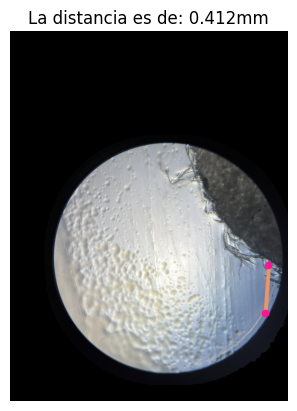

/content/Dataset_Prueba50T/IMG_5752.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5752.JPEG: 160x128 1 Parte1, 9.7ms
Speed: 0.9ms preprocess, 9.7ms inference, 2.0ms postprocess per image at shape (1, 3, 160, 128)
IMG_5752.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.3ms
Speed: 1.1ms preprocess, 27.3ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


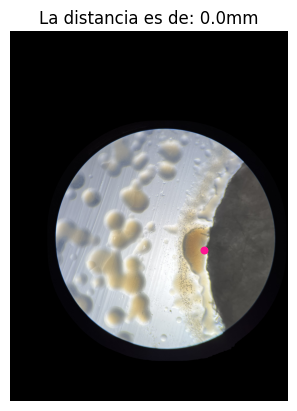

/content/Dataset_Prueba50T/IMG_3101.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3101.JPEG: 160x128 1 Parte1, 12.0ms
Speed: 0.8ms preprocess, 12.0ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_3101.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.3ms postprocess per image at shape (1, 3, 224, 192)


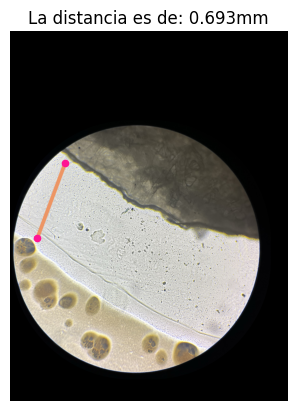

/content/Dataset_Prueba50T/IMG_5866.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5866.JPEG: 160x128 1 Parte1, 11.3ms
Speed: 0.8ms preprocess, 11.3ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5866.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


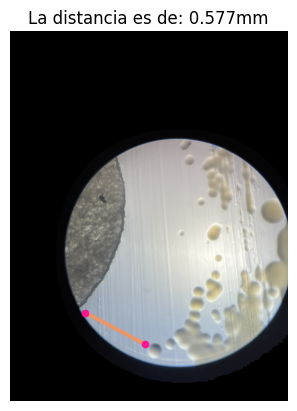

/content/Dataset_Prueba50T/IMG_5848.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5848.JPEG: 160x128 1 Parte1, 9.7ms
Speed: 0.8ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_5848.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 31.2ms
Speed: 1.1ms preprocess, 31.2ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


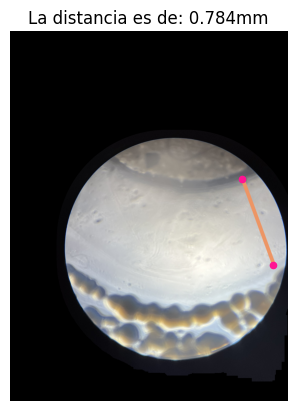

/content/Dataset_Prueba50T/IMG_5878.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5878.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5878.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.0ms postprocess per image at shape (1, 3, 224, 192)


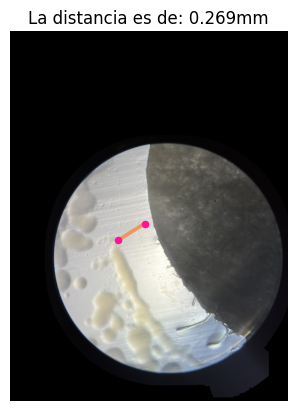

/content/Dataset_Prueba50T/IMG_3123.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3123.JPEG: 160x128 1 Parte1, 10.5ms
Speed: 0.8ms preprocess, 10.5ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_3123.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.2ms
Speed: 1.0ms preprocess, 27.2ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


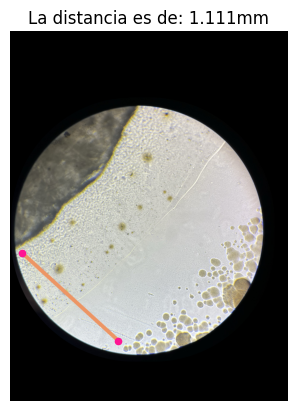

/content/Dataset_Prueba50T/IMG_5083.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5083.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5083.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 1.8ms postprocess per image at shape (1, 3, 224, 192)


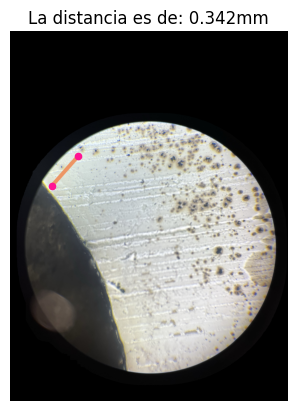

/content/Dataset_Prueba50T/IMG_3094.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3094.JPEG: 160x128 1 Parte1, 8.7ms
Speed: 0.8ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3094.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 26.9ms
Speed: 0.8ms preprocess, 26.9ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


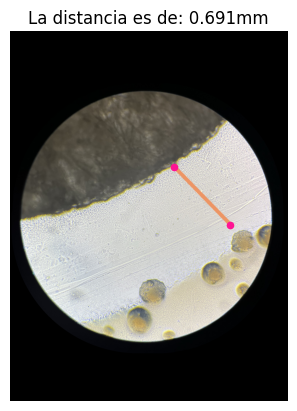

/content/Dataset_Prueba50T/IMG_What3.jpeg

image 1/1 /content/Dataset_Prueba50T/IMG_What3.jpeg: 160x128 1 Parte1, 8.7ms
Speed: 2.5ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_What3.jpeg

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 192)


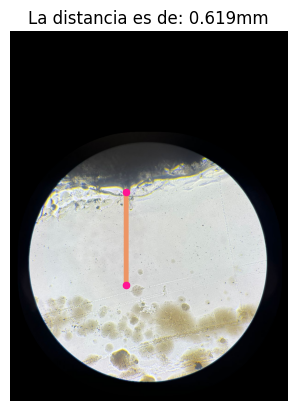

/content/Dataset_Prueba50T/IMG_3130.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3130.JPEG: 160x128 1 Parte1, 9.1ms
Speed: 0.7ms preprocess, 9.1ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3130.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 3.3ms postprocess per image at shape (1, 3, 224, 192)


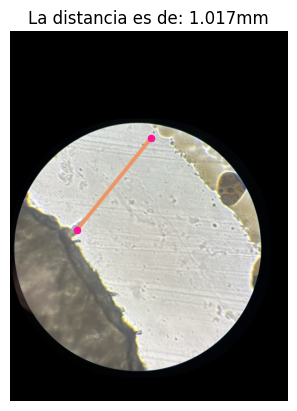

/content/Dataset_Prueba50T/IMG_5764.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5764.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.7ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5764.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 5.3ms postprocess per image at shape (1, 3, 224, 192)


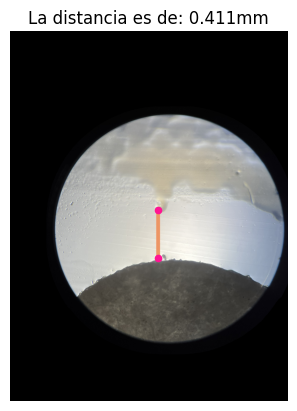

/content/Dataset_Prueba50T/IMG_2956.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2956.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.7ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_2956.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


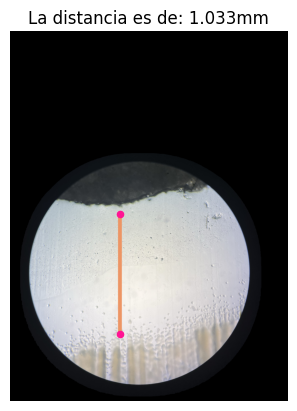

/content/Dataset_Prueba50T/IMG_5858.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5858.JPEG: 160x128 1 Parte1, 9.7ms
Speed: 0.8ms preprocess, 9.7ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_5858.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 98.3ms
Speed: 1.1ms preprocess, 98.3ms inference, 9.8ms postprocess per image at shape (1, 3, 224, 192)


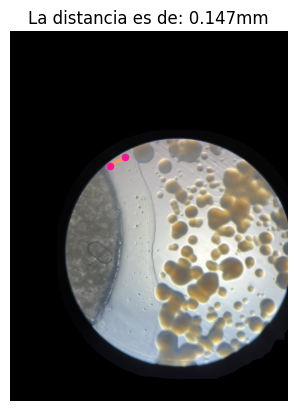

/content/Dataset_Prueba50T/IMG_5073.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5073.JPEG: 160x128 1 Parte1, 11.4ms
Speed: 0.9ms preprocess, 11.4ms inference, 3.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_5073.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.2ms preprocess, 27.1ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


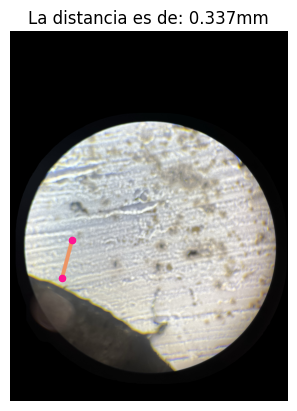

/content/Dataset_Prueba50T/IMG_2950.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2950.JPEG: 160x128 1 Parte1, 12.8ms
Speed: 0.8ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_2950.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.0ms preprocess, 27.1ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


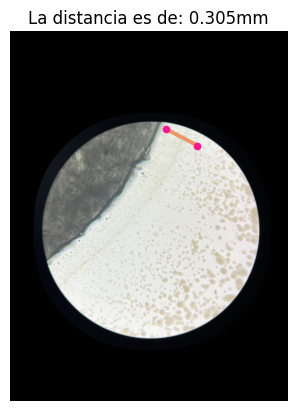

/content/Dataset_Prueba50T/IMG_5849.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5849.JPEG: 160x128 1 Parte1, 15.3ms
Speed: 0.8ms preprocess, 15.3ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5849.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


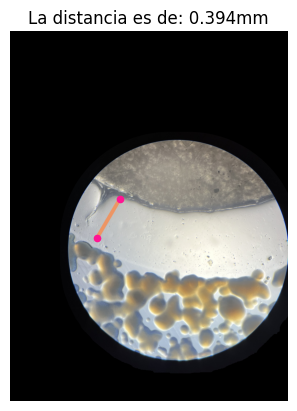

/content/Dataset_Prueba50T/IMG_3140.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3140.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3140.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


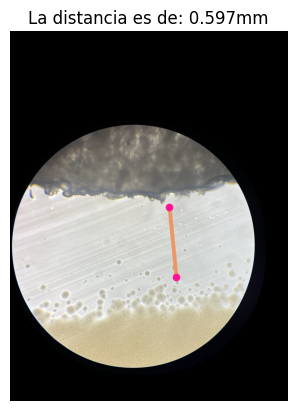

/content/Dataset_Prueba50T/IMG_3133.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3133.JPEG: 160x128 1 Parte1, 10.9ms
Speed: 0.8ms preprocess, 10.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3133.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.0ms preprocess, 27.1ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


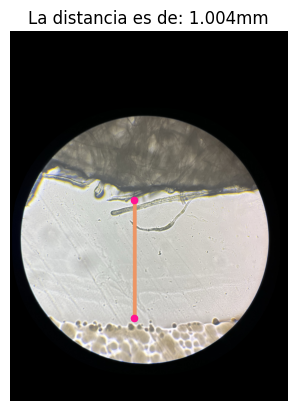

/content/Dataset_Prueba50T/IMG_2959.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2959.JPEG: 160x128 1 Parte1, 9.0ms
Speed: 0.8ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_2959.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.2ms
Speed: 1.1ms preprocess, 27.2ms inference, 3.6ms postprocess per image at shape (1, 3, 224, 192)


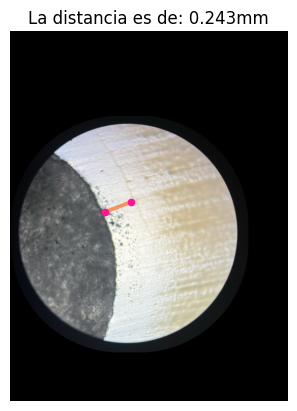

/content/Dataset_Prueba50T/IMG_5869.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5869.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5869.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.2ms postprocess per image at shape (1, 3, 224, 192)


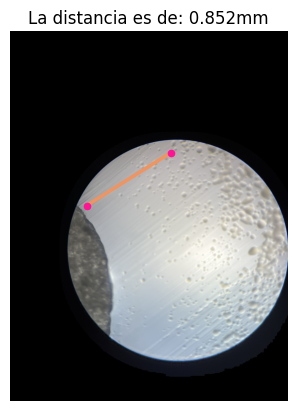

/content/Dataset_Prueba50T/IMG_5047.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5047.JPEG: 160x128 1 Parte1, 9.3ms
Speed: 0.8ms preprocess, 9.3ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5047.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


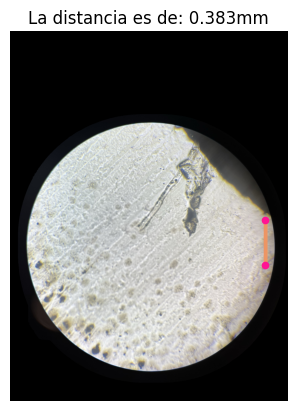

/content/Dataset_Prueba50T/IMG_5851.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5851.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.8ms postprocess per image at shape (1, 3, 160, 128)
IMG_5851.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.2ms preprocess, 27.1ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


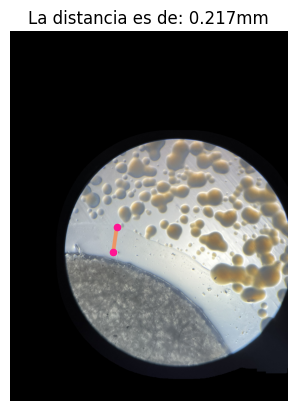

/content/Dataset_Prueba50T/IMG_3141.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3141.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.8ms preprocess, 8.9ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_3141.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 31.7ms
Speed: 1.1ms preprocess, 31.7ms inference, 4.2ms postprocess per image at shape (1, 3, 224, 192)


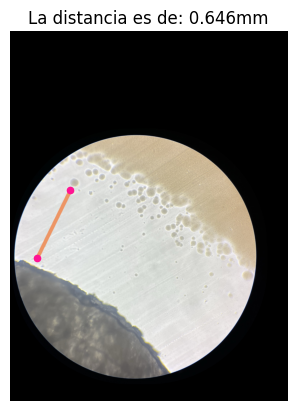

/content/Dataset_Prueba50T/IMG_5767.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5767.JPEG: 160x128 1 Parte1, 8.6ms
Speed: 0.8ms preprocess, 8.6ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5767.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


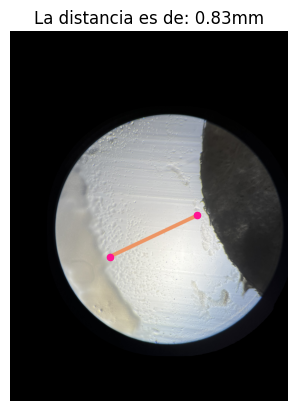

/content/Dataset_Prueba50T/IMG_5854.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5854.JPEG: 160x128 1 Parte1, 10.4ms
Speed: 1.0ms preprocess, 10.4ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_5854.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 28.2ms
Speed: 1.1ms preprocess, 28.2ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


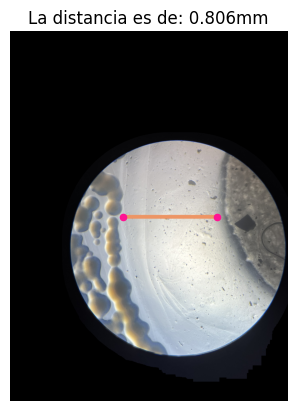

/content/Dataset_Prueba50T/IMG_3111.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3111.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_3111.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


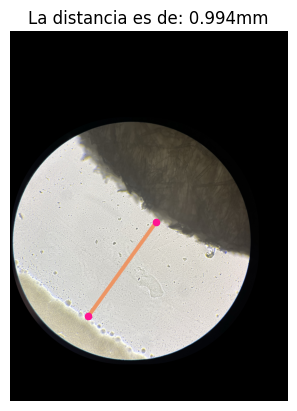

/content/Dataset_Prueba50T/IMG_3118.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3118.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.7ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3118.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


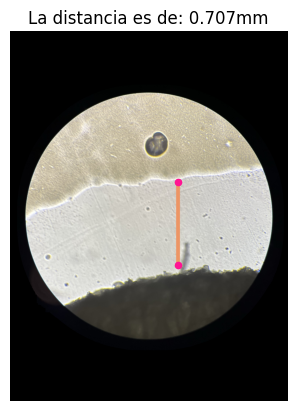

/content/Dataset_Prueba50T/IMG_5847.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5847.JPEG: 160x128 1 Parte1, 14.0ms
Speed: 0.8ms preprocess, 14.0ms inference, 4.9ms postprocess per image at shape (1, 3, 160, 128)
IMG_5847.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


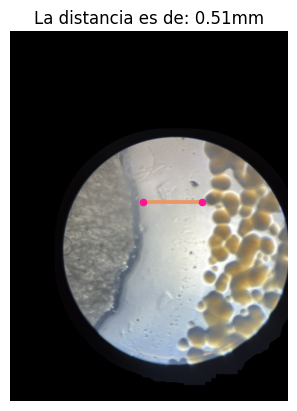

/content/Dataset_Prueba50T/IMG_5868.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5868.JPEG: 160x128 1 Parte1, 8.7ms
Speed: 0.7ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5868.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


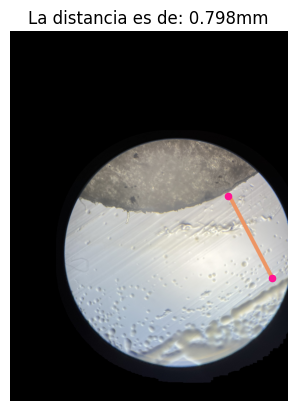

/content/Dataset_Prueba50T/IMG_3115.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3115.JPEG: 160x128 1 Parte1, 12.9ms
Speed: 0.9ms preprocess, 12.9ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3115.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


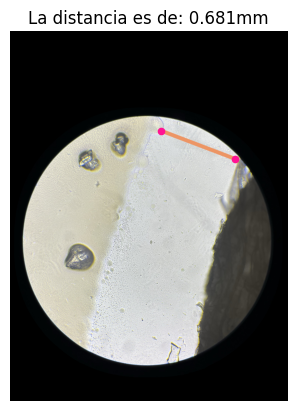

/content/Dataset_Prueba50T/IMG_5863.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5863.JPEG: 160x128 1 Parte1, 8.9ms
Speed: 0.7ms preprocess, 8.9ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_5863.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


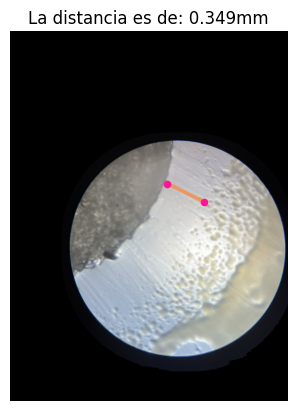

/content/Dataset_Prueba50T/IMG_What9.jpeg

image 1/1 /content/Dataset_Prueba50T/IMG_What9.jpeg: 160x128 1 Parte1, 9.5ms
Speed: 0.8ms preprocess, 9.5ms inference, 1.9ms postprocess per image at shape (1, 3, 160, 128)
IMG_What9.jpeg

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 3.1ms postprocess per image at shape (1, 3, 224, 192)


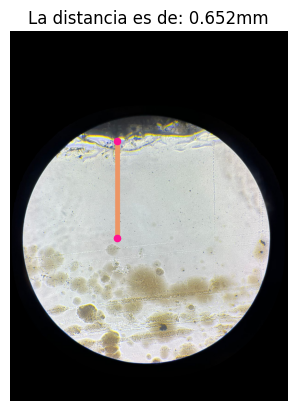

/content/Dataset_Prueba50T/IMG_3095.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3095.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_3095.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


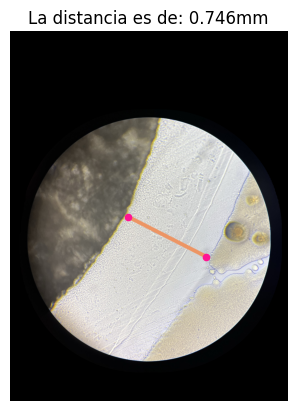

/content/Dataset_Prueba50T/IMG_5044.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5044.JPEG: 160x128 1 Parte1, 9.5ms
Speed: 0.8ms preprocess, 9.5ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5044.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 30.3ms
Speed: 1.1ms preprocess, 30.3ms inference, 2.5ms postprocess per image at shape (1, 3, 224, 192)


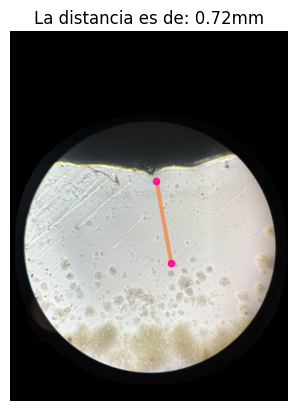

/content/Dataset_Prueba50T/IMG_5861.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5861.JPEG: 160x128 1 Parte1, 8.7ms
Speed: 0.8ms preprocess, 8.7ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_5861.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.3ms
Speed: 1.1ms preprocess, 27.3ms inference, 5.5ms postprocess per image at shape (1, 3, 224, 192)


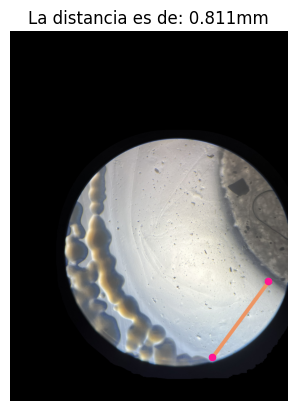

/content/Dataset_Prueba50T/IMG_5072.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5072.JPEG: 160x128 1 Parte1, 11.7ms
Speed: 0.8ms preprocess, 11.7ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_5072.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


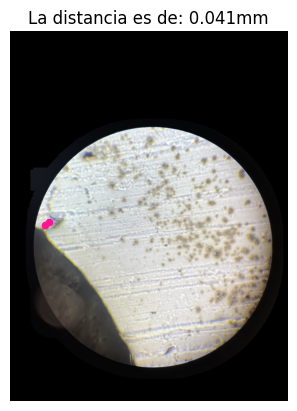

/content/Dataset_Prueba50T/IMG_What5.jpeg

image 1/1 /content/Dataset_Prueba50T/IMG_What5.jpeg: 160x128 1 Parte1, 9.3ms
Speed: 0.8ms preprocess, 9.3ms inference, 1.5ms postprocess per image at shape (1, 3, 160, 128)
IMG_What5.jpeg

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.2ms
Speed: 1.0ms preprocess, 27.2ms inference, 2.9ms postprocess per image at shape (1, 3, 224, 192)


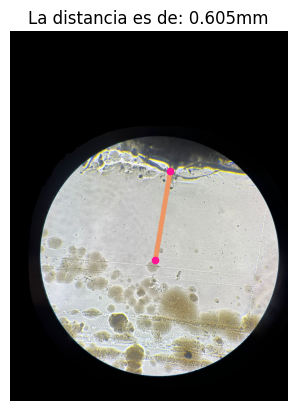

/content/Dataset_Prueba50T/IMG_5048.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5048.JPEG: 160x128 1 Parte1, 10.1ms
Speed: 0.7ms preprocess, 10.1ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_5048.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 28.6ms
Speed: 1.1ms preprocess, 28.6ms inference, 3.5ms postprocess per image at shape (1, 3, 224, 192)


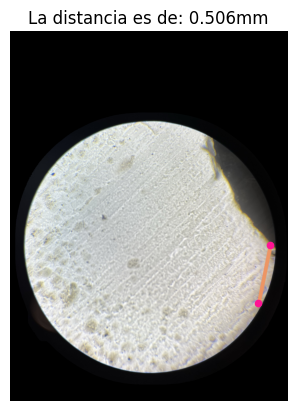

/content/Dataset_Prueba50T/IMG_5052.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5052.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5052.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.0ms preprocess, 27.1ms inference, 2.8ms postprocess per image at shape (1, 3, 224, 192)


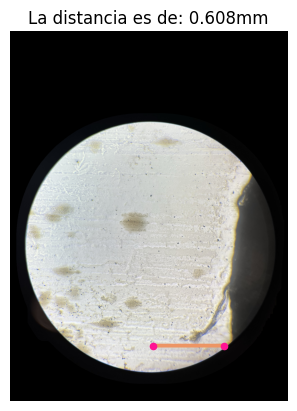

/content/Dataset_Prueba50T/IMG_3113.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3113.JPEG: 160x128 1 Parte1, 8.7ms
Speed: 0.8ms preprocess, 8.7ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_3113.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.0ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


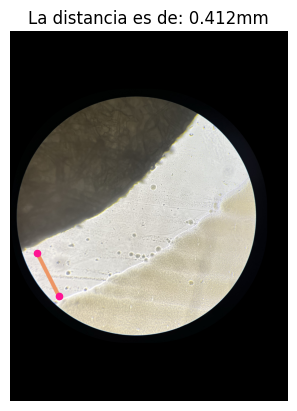

/content/Dataset_Prueba50T/IMG_5066.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5066.JPEG: 160x128 1 Parte1, 9.0ms
Speed: 0.8ms preprocess, 9.0ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5066.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.1ms
Speed: 1.1ms preprocess, 27.1ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


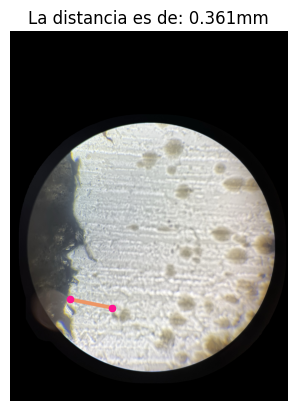

/content/Dataset_Prueba50T/IMG_5856.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5856.JPEG: 160x128 1 Parte1, 9.8ms
Speed: 0.8ms preprocess, 9.8ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5856.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.3ms
Speed: 1.1ms preprocess, 27.3ms inference, 2.7ms postprocess per image at shape (1, 3, 224, 192)


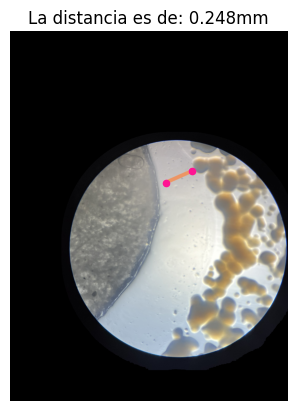

/content/Dataset_Prueba50T/IMG_5859.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_5859.JPEG: 160x128 1 Parte1, 9.2ms
Speed: 0.8ms preprocess, 9.2ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_5859.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.2ms preprocess, 27.0ms inference, 2.6ms postprocess per image at shape (1, 3, 224, 192)


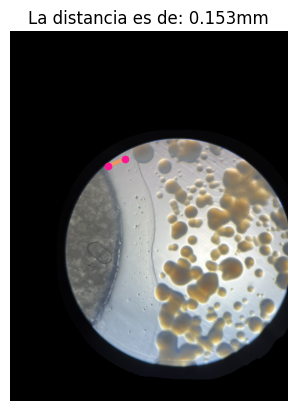

/content/Dataset_Prueba50T/IMG_3127.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_3127.JPEG: 160x128 1 Parte1, 8.8ms
Speed: 0.8ms preprocess, 8.8ms inference, 1.7ms postprocess per image at shape (1, 3, 160, 128)
IMG_3127.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.0ms
Speed: 1.1ms preprocess, 27.0ms inference, 2.4ms postprocess per image at shape (1, 3, 224, 192)


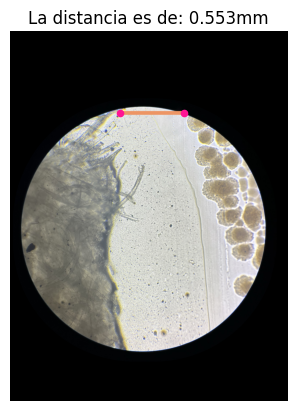

/content/Dataset_Prueba50T/IMG_2951.JPEG

image 1/1 /content/Dataset_Prueba50T/IMG_2951.JPEG: 160x128 1 Parte1, 14.0ms
Speed: 0.8ms preprocess, 14.0ms inference, 1.6ms postprocess per image at shape (1, 3, 160, 128)
IMG_2951.JPEG

image 1/1 /content/clean_img.png: 224x192 1 Bacterias, 1 Sensidisco, 27.2ms
Speed: 1.1ms preprocess, 27.2ms inference, 3.1ms postprocess per image at shape (1, 3, 224, 192)


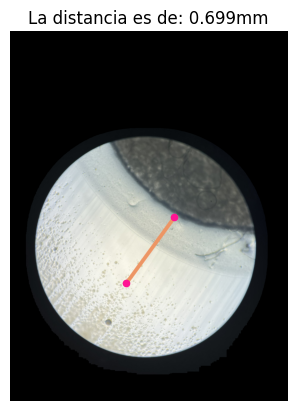

['IMG_2953.JPEG']


In [22]:
#Imagenes que no se segmentaron correctamente
errores = []
# Name of the images
nombre_imagenes = []
#Distance pixeles
Distancia_pixeles = []
#Distance mm
Distancia_mm = []
factor = 1295 #Diameter of the visible region of the microscope in pixeles
dir = '/content/Dataset_Prueba50T'
for image in os.listdir(dir):
  path = os.path.join(dir, image)
  print(path)
  img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
  result_det = model_det(path)
  result_det = result_det[0]
  bx, by, bw, bh = np.array(result_det.boxes.xyxy[0].cpu())
  height, width, _ = img.shape
  if((bx+bw)<= (by+bh)):
    radio_bb = int((bx+bw)/2)
  else:
    radio_bb = int((by+bh)/2)
  cx_b, cy_b = int((bx+bw)/2), int((by+bh)/2)
  mask = np.zeros((height, width), dtype = np.uint8)
  mask = cv2.circle(mask, (cx_b, cy_b), radio_bb - 50, 255, -1)
  cv2.imwrite('/content/mask.png', mask)
  mask = cv2.imread('/content/mask.png')
  img2 = cv2.bitwise_and(mask, img)
  #Pasamos la imagen a escala de grises para umbralizarla (binarizarla)
  img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
  umbral = 25
  _ , img2 = cv2.threshold(img2, umbral ,255, cv2.THRESH_BINARY)
  struct = np.ones((8, 8), np.uint8)
  img2 = cv2.morphologyEx(img2, cv2.MORPH_OPEN, struct)
  img2 = cv2.dilate(img2,struct,iterations = 15)
  cv2.imwrite('/content/imgsinFondo.png', img2)
  mask = cv2.imread('/content/imgsinFondo.png')
  clean_img = cv2.cvtColor(cv2.bitwise_and(img, mask), cv2.COLOR_RGB2BGR)
  cv2.imwrite('/content/clean_img.png', clean_img)
  print(image)

  #____________________________________________________________________________________________________________________________________________________________________________
  result = model_seg.predict('/content/clean_img.png')
  detections = sv.Detections.from_ultralytics(result[0])
  detections_bact = detections[detections.class_id == 0] #ClassID de las bacterias
  detections_sens = detections [detections.class_id == 1] #ClassID del sensidisco
  if(len(detections_sens.mask) != 0 and len(detections_bact.mask) != 0 ):
    nombre_imagenes.append(image)
    mask_bact = np.reshape(detections_bact.mask.flatten(), (height, width)).astype(int)
    mask_sens = np.reshape(detections_sens.mask.flatten(), (height, width)).astype(int)
    mask_bact = np.where(mask_bact, 255, 0).astype(np.uint8)
    mask_sens = np.where(mask_sens, 255, 0).astype(np.uint8)
    plt.gray()
    image1 = Image.fromarray(mask_bact)
    image2 = Image.fromarray(mask_sens)
    image1.save('/content/1.png')
    image2.save('/content/2.png')
    #_______________________________________________________________________________________________
    im = imread('/content/2.png')
    im[im > 0.5] = 1 # create binary image by thresholding with fixed threshold
    im[im <= 0.5] = 0
    im = im.astype(bool)
    im1 = remove_small_objects(im, 40000, connectivity=1)
    imsave('/content/2.png', im1)
    image1 = cv2.cvtColor(cv2.imread('/content/1.png'), cv2.COLOR_BGR2GRAY)
    image2 = cv2.cvtColor(cv2.imread('/content/2.png'), cv2.COLOR_BGR2GRAY)
    umbral = 20
    _ , image1 = cv2.threshold(image1, umbral ,255, cv2.THRESH_BINARY)
    _ , image2 = cv2.threshold(image2, umbral ,255, cv2.THRESH_BINARY)
    contornosimg1, _ = cv2.findContours(image1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    contornosimg2, _ = cv2.findContours(image2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
    puntos_contorno_bx = []
    puntos_contorno_by = []
    puntos_contorno_sx = []
    puntos_contorno_sy = []
    # Recorrer todos los contornos encontrados para bacterias
    for contorno in contornosimg1:
        for punto in contorno:
            x, y = punto[0]
            puntos_contorno_bx.append(x)
            puntos_contorno_by.append(y)
    # Recorrer todos los contornos encontrados para sensidisco
    for contorno in contornosimg2:
        for punto in contorno:
            x, y = punto[0]
            puntos_contorno_sx.append(x)
            puntos_contorno_sy.append(y)
    masks = cv2.bitwise_or(image1, image2)
    aux, x1min, x2min = distancia_minima(puntos_contorno_bx, puntos_contorno_by, puntos_contorno_sx, puntos_contorno_sy)
    cv2.line(clean_img, (puntos_contorno_bx[x1min], puntos_contorno_by[x1min]),
            (puntos_contorno_sx[x2min], puntos_contorno_sy[x2min]),
            (100, 149, 237), 20)
    plt.imshow(cv2.cvtColor(clean_img, cv2.COLOR_BGR2RGB)); plt.axis('off')
    plt.scatter(puntos_contorno_bx[x1min], puntos_contorno_by[x1min], color = 'deeppink', s = 20)
    plt.scatter(puntos_contorno_sx[x2min], puntos_contorno_sy[x2min], color = 'deeppink', s = 20)
    distanciapix_sb = aux
    Distancia_pixeles.append(distanciapix_sb)
    distanciamm_sb = (distanciapix_sb*2) / factor
    Distancia_mm.append(distanciamm_sb)
    plt.title('La distancia es de: ' + str(np.round(distanciamm_sb, 3)) + 'mm')
    plt.show()
  else:
    errores.append(image)
print(errores)